In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.cm as cm
from matplotlib.cm import ScalarMappable


import scipy
import numpy as np
import pandas as pd

from pathlib import Path
import soundfile as sf
from tqdm import tqdm
from sklearn.cluster import KMeans
import scipy.signal as signal
import scipy.special as special

In [2]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
from pipeline import pipeline
from cfg import get_config

import bout_clustering as clstr

In [3]:
C = 343 # m/s speed of sound in air
FS = 250000
SNR_CALC_LENGTH = 0.030
SNR_OFFSET_BEFORE_CALL = 0.015
TIME_PAD_FOR_ECHO = 0.002
CORR_LENGTH = 0.025
SELECTED_CHANNEL_FOR_REF = 7
NUM_CHANNELS_TOTAL = 8
FILE_DURATION = 120
HOUR_TAG = 'hour_0'
ZMAG_REF_TO_6 = 46.5625
ZMAG_REF_TO_1 = 35.5
XMAG_REF_TO_1 = 17.7
YMAG_REF_TO_6 = 21
YMAG_REF_TO_1 = 37.5
A_LOCS_MAT = np.array([[-XMAG_REF_TO_1, YMAG_REF_TO_1, -ZMAG_REF_TO_1],
                    [-XMAG_REF_TO_1, -YMAG_REF_TO_1, -ZMAG_REF_TO_1],
                    [-XMAG_REF_TO_1, YMAG_REF_TO_1, 0],
                    [-XMAG_REF_TO_1, -YMAG_REF_TO_1, 0],
                    [-XMAG_REF_TO_1, YMAG_REF_TO_6, ZMAG_REF_TO_6],
                    [-XMAG_REF_TO_1, -YMAG_REF_TO_6, ZMAG_REF_TO_6],
                    [0, 0, -ZMAG_REF_TO_1],
                    [0, 0, 0]])

In [4]:
import UBNA_localize_process_GCC as localize

In [5]:
def plot_snr_and_mic_labels(x_axis, y_axis):
    for i in np.linspace(0, x_axis.shape[0]-1, 11).astype(int):
        scale = 0.3
        t_x, t_y = x_axis[i]+scale, y_axis[i]+scale
        plt.text(x=t_x, y=t_y, s=f'det{round(i, 1)}', fontsize=14)

In [6]:
%matplotlib inline

microphones_used = np.array([1, 3, 4, 5, 6, 7, 8])
ind_of_selected_channel = np.where(microphones_used==(SELECTED_CHANNEL_FOR_REF+1))[0]
SELECTED_MIC_FOR_REF = microphones_used[ind_of_selected_channel]
non_ref_microphones_used = microphones_used[microphones_used!=SELECTED_MIC_FOR_REF]
num_good_channels = microphones_used.shape[0]
num_nonref_channels = num_good_channels-1

file_dir = Path('/Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array')
site_key = 'Telephone'
freq_key = ''

data_params = dict()
data_params['site_tag'] = site_key
data_params['type_tag'] = freq_key
data_params['detector_tag'] = 'bd2'
data_params['assembly_type'] = 'kmeans'
file_paths = dict()
file_paths["SITE_folder"] = f'/Users/adityakrishna/duty-cycle-investigation/data/2022_detector_summaries/{data_params["site_tag"]}'
file_paths["detector_TYPE_SITE_YEAR"] = f'{data_params["detector_tag"]}__{data_params["type_tag"]}{data_params["site_tag"]}_2022_{data_params["assembly_type"]}'
location_df = pd.read_csv(f'{file_paths["SITE_folder"]}/{file_paths["detector_TYPE_SITE_YEAR"]}.csv', index_col=0, low_memory=False)
bout_params = clstr.get_bout_params_from_location(location_df, data_params)
bout_params

{'site_key': 'Telephone',
 'HF_bci': 4640.588823870457,
 'LF_bci': 5004.35931804827}

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_240to360/hour_0_channel7_240to360.WAV


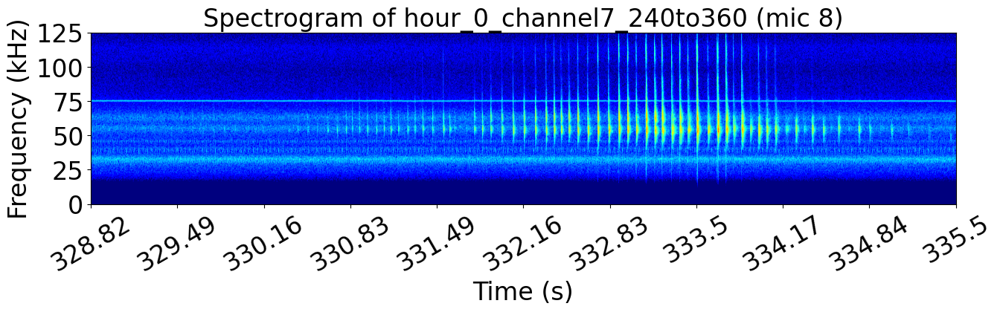

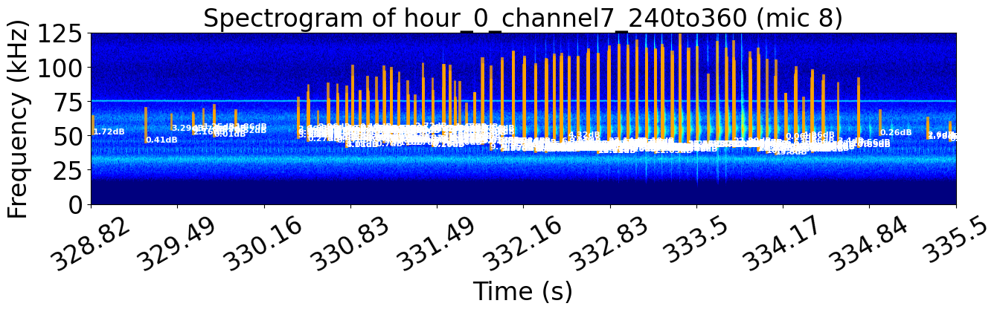

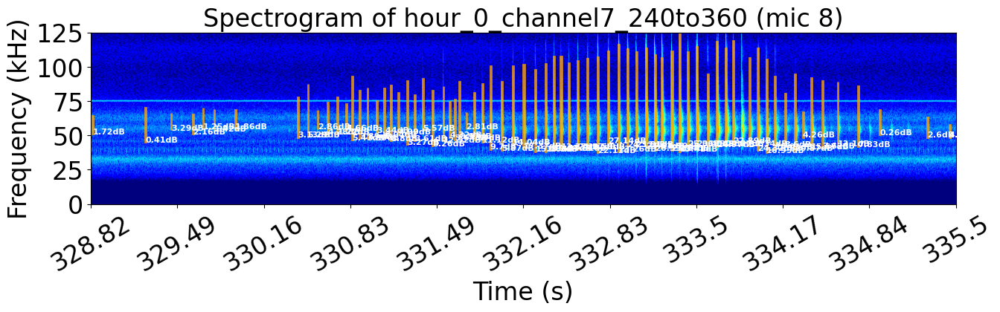

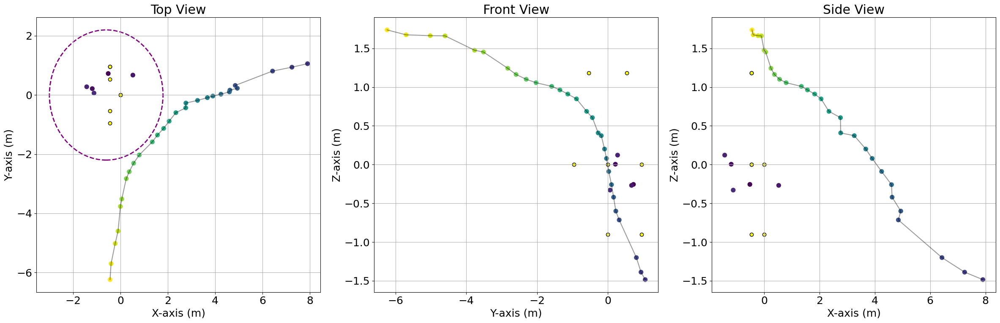

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_480to600/hour_0_channel7_480to600.WAV


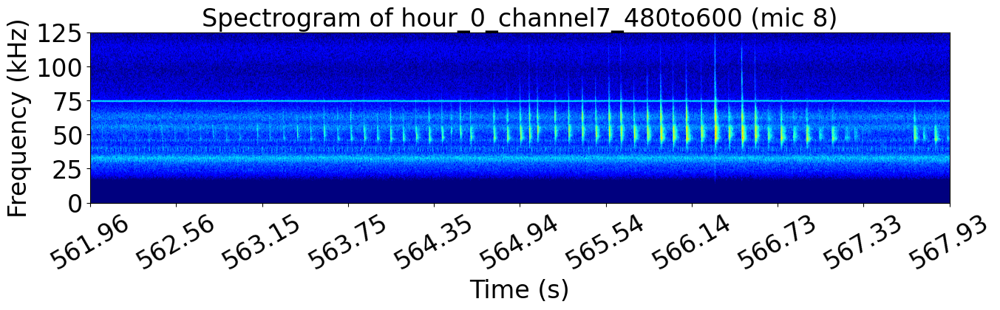

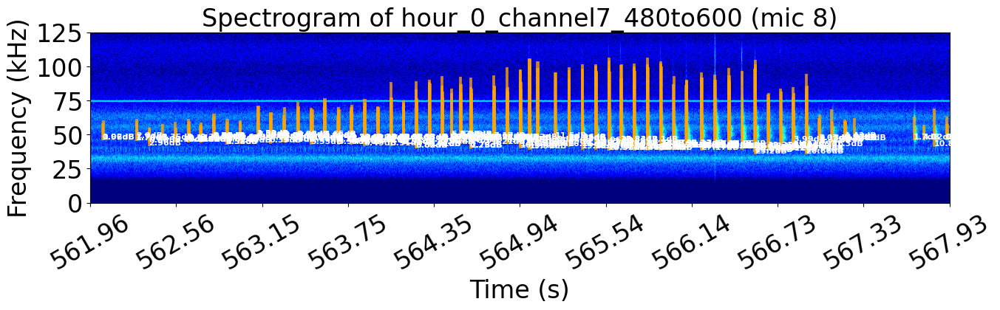

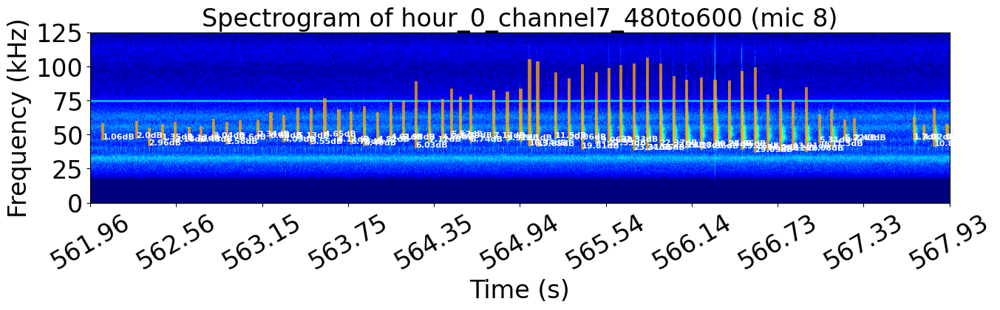

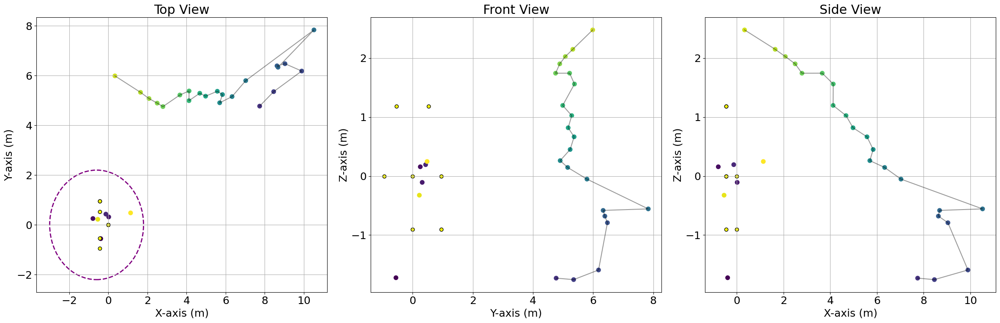

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_480to600/hour_0_channel7_480to600.WAV


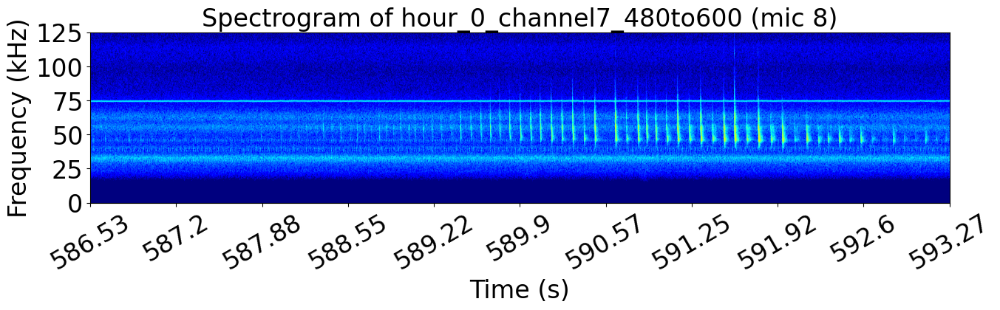

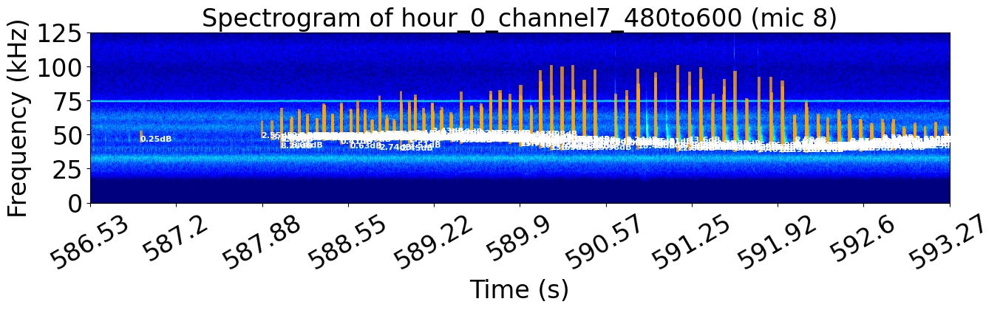

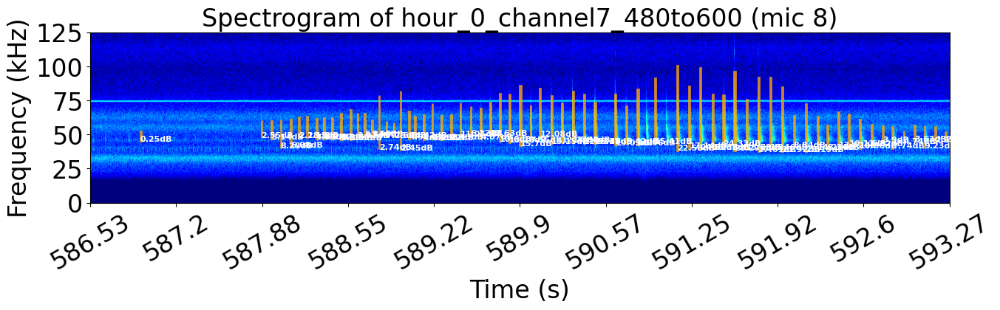

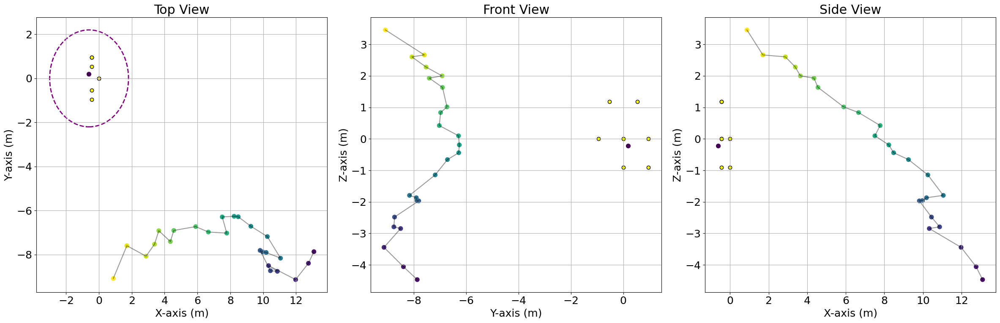

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_1440to1560/hour_0_channel7_1440to1560.WAV


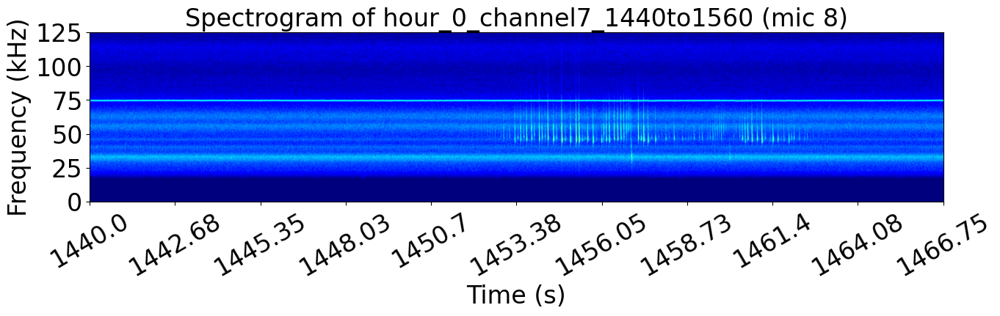

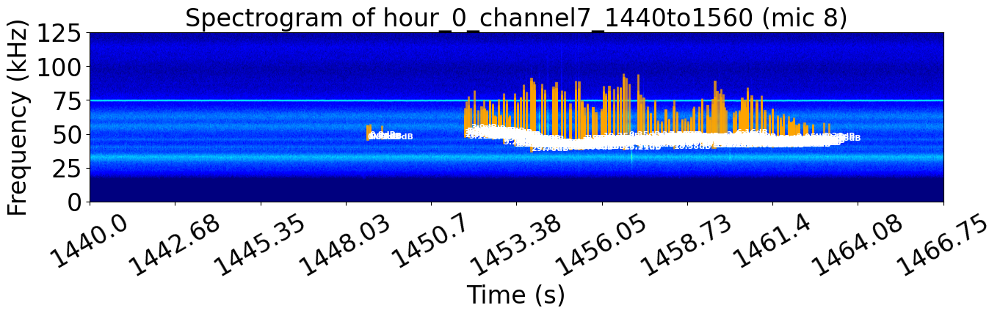

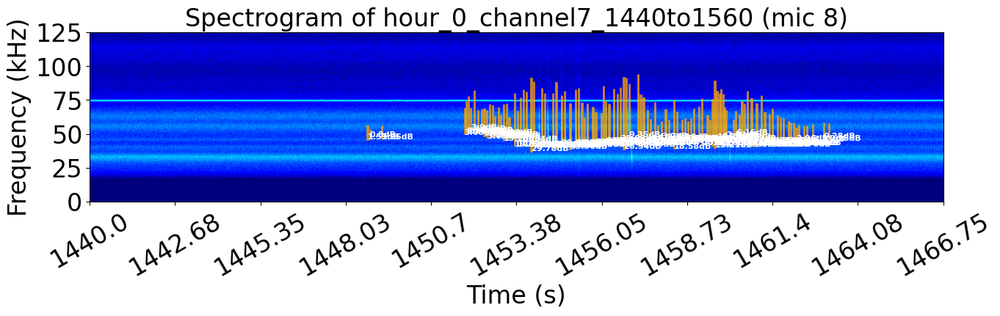

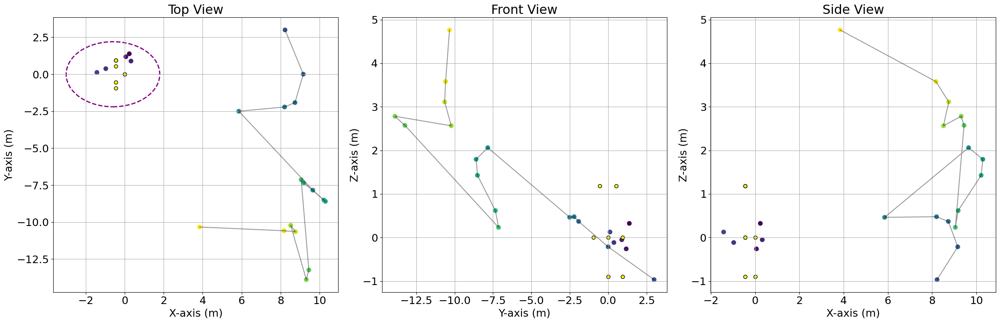

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_1680to1800/hour_0_channel7_1680to1800.WAV


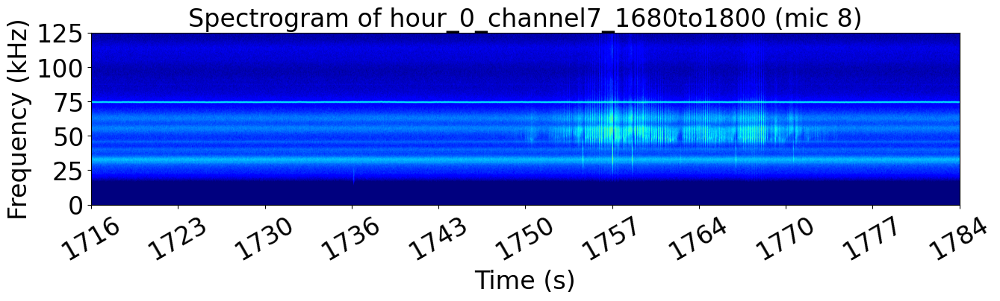

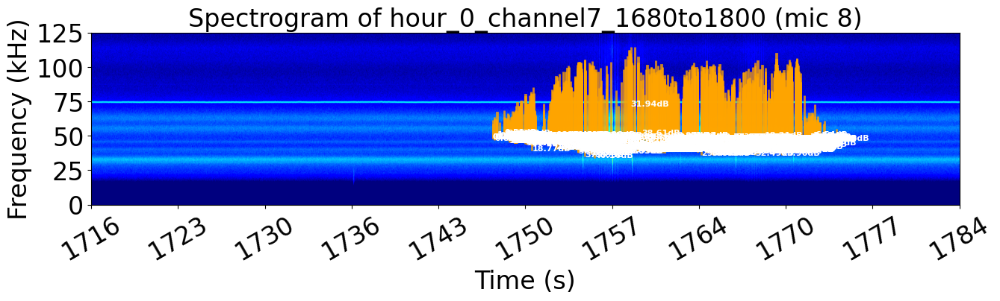

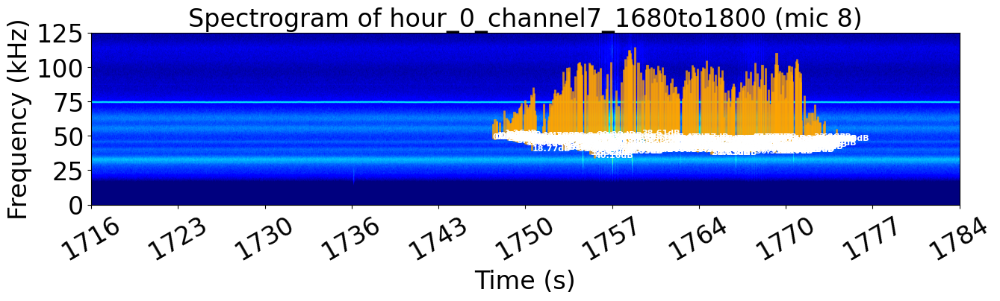

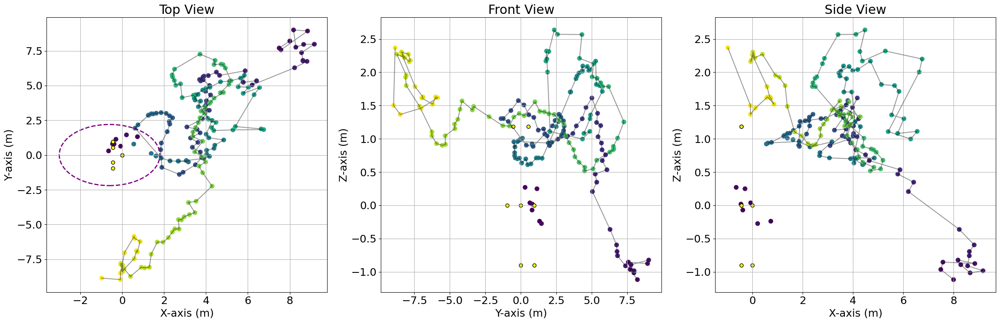

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_1800to1920/hour_0_channel7_1800to1920.WAV


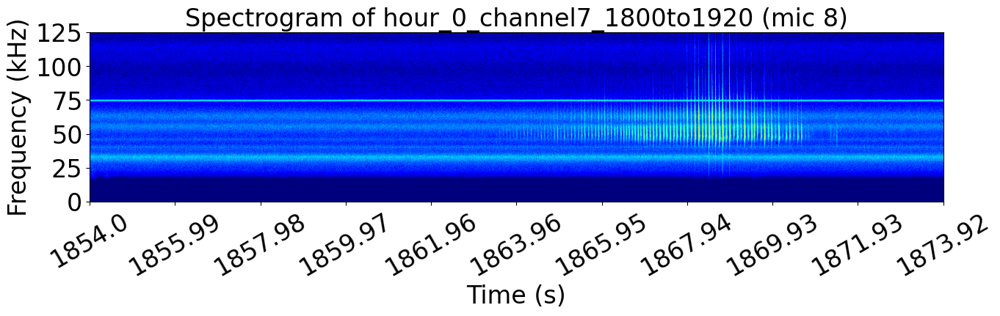

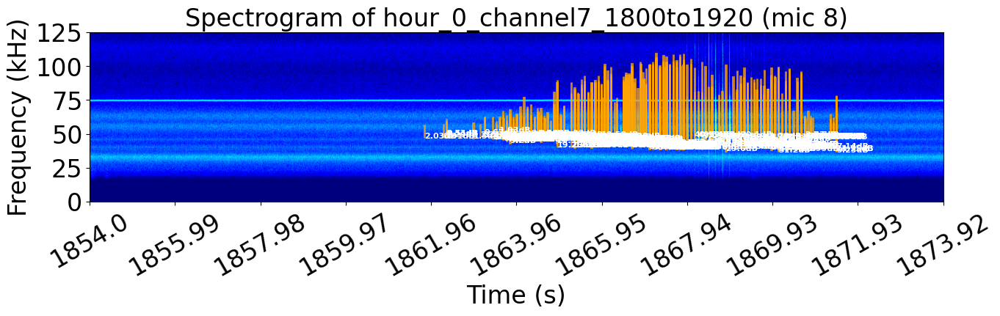

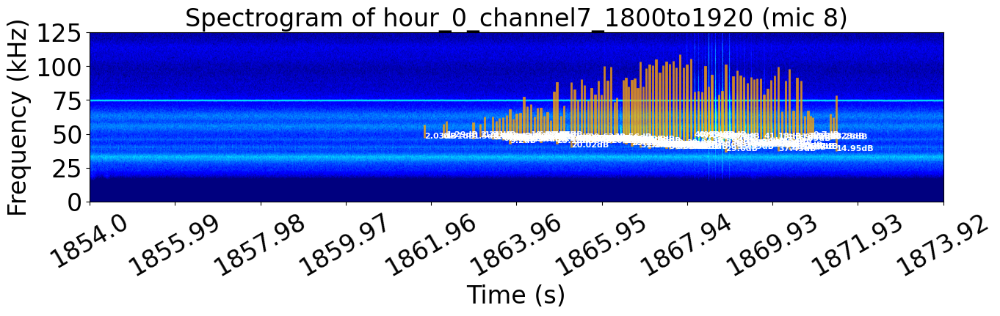

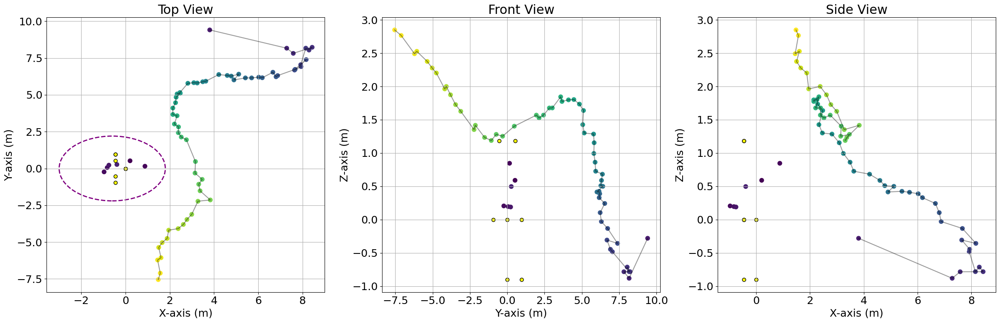

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_1920to2040/hour_0_channel7_1920to2040.WAV


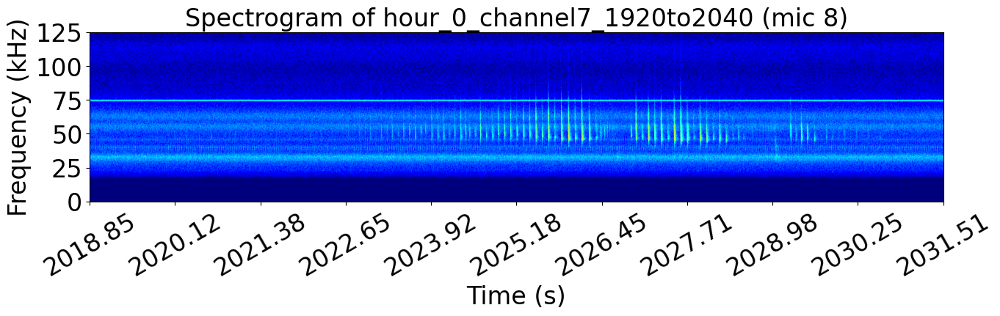

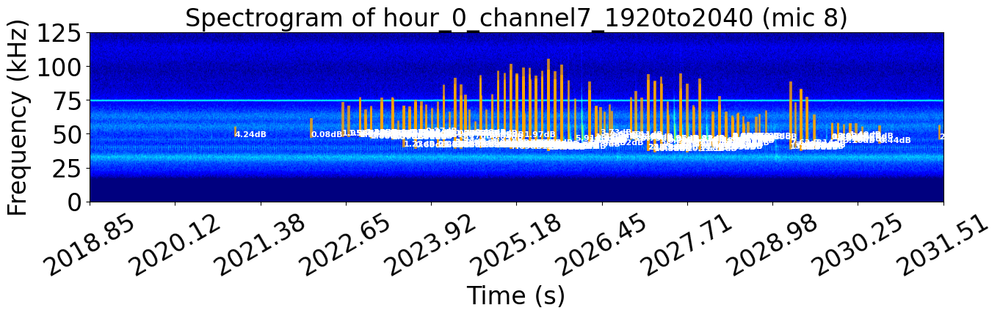

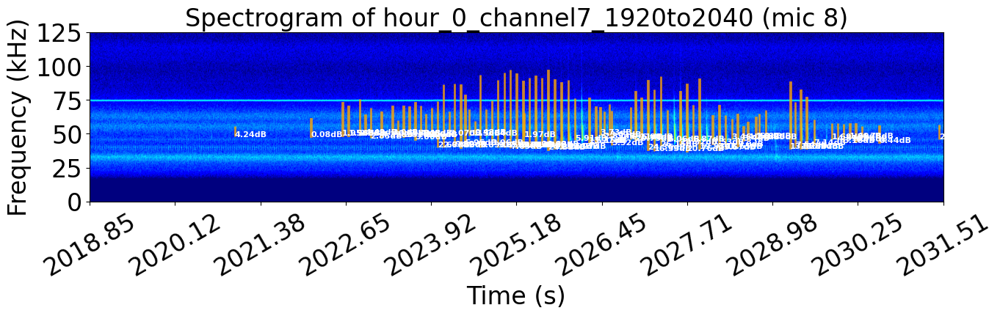

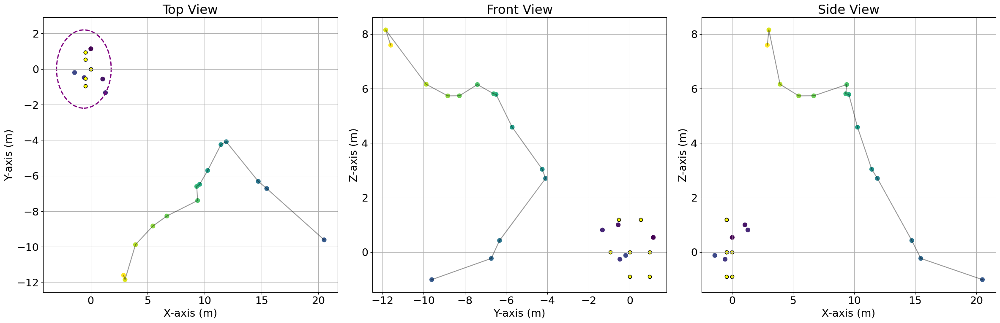

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_3000to3120/hour_0_channel7_3000to3120.WAV


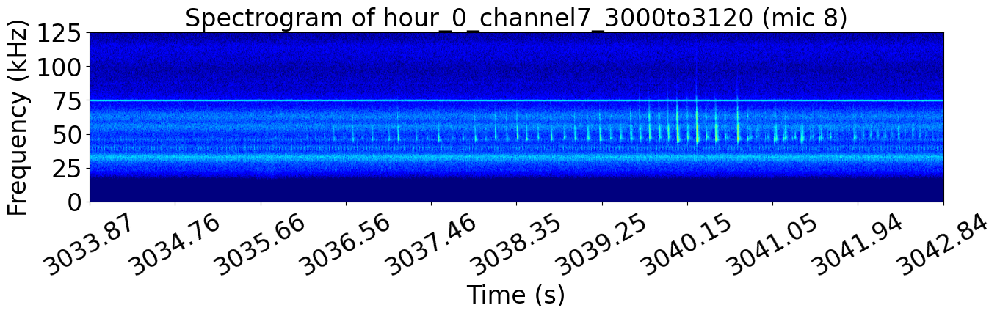

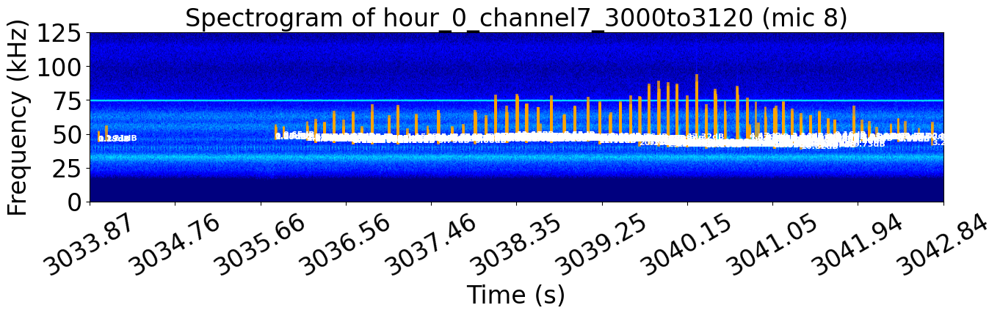

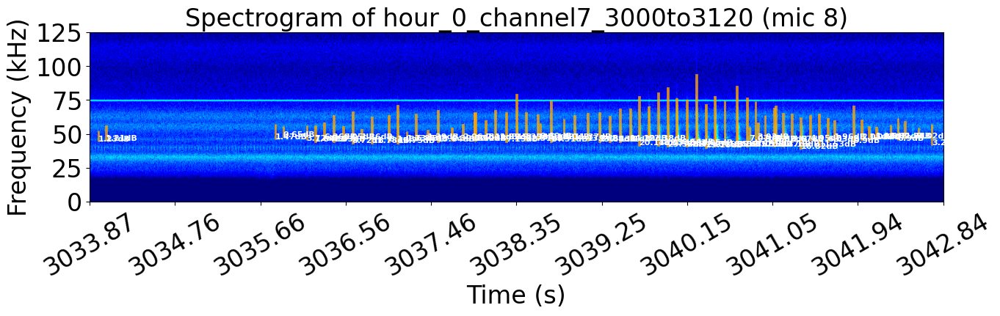

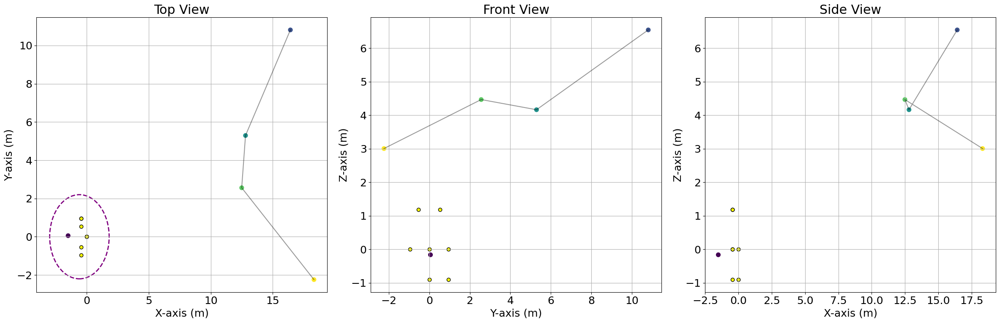

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_3000to3120/hour_0_channel7_3000to3120.WAV


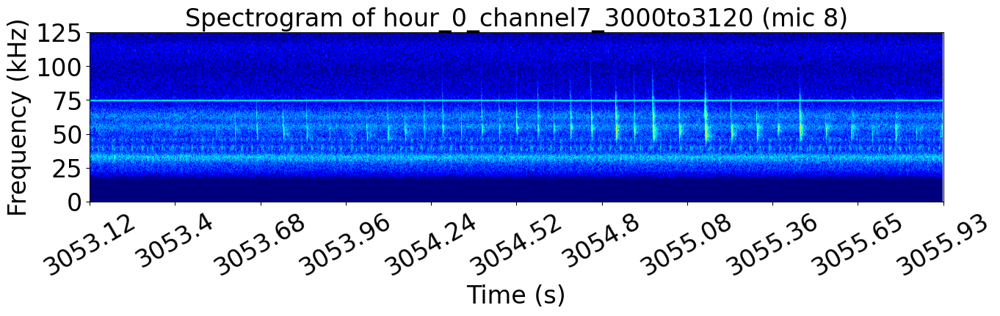

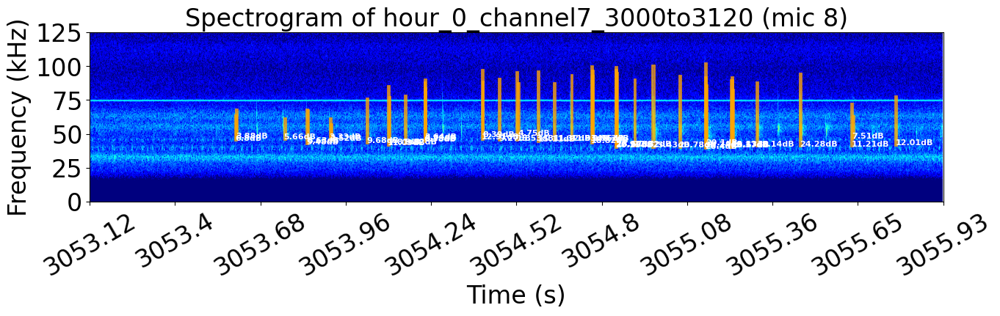

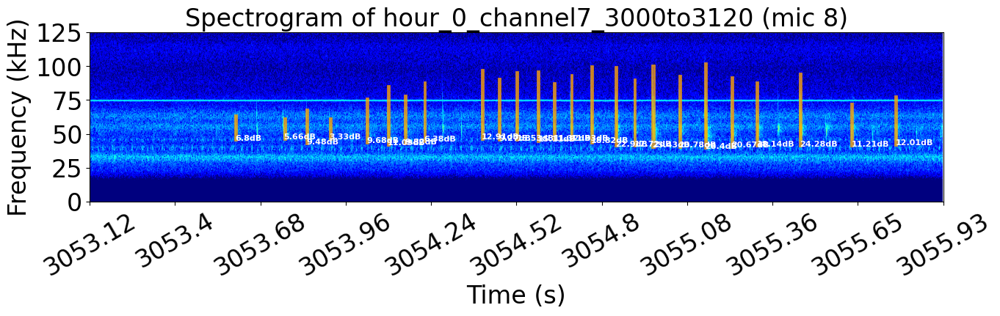

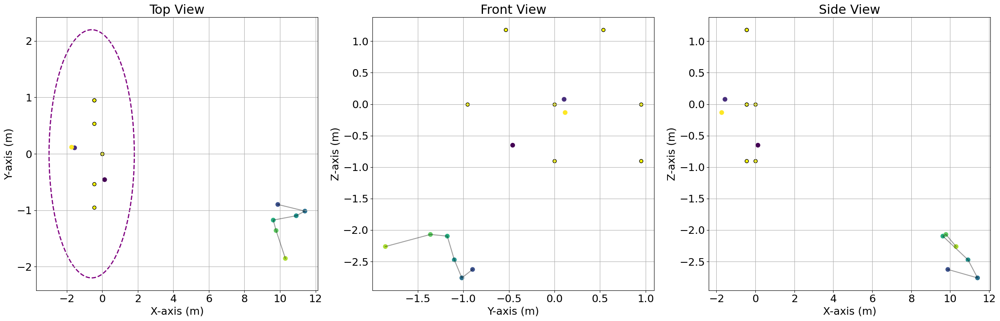

Currently at /Volumes/Elements/UBNA_array_tests/mic_array_test_20241010/inUBNA/array/hour_0_3000to3120/hour_0_channel7_3000to3120.WAV


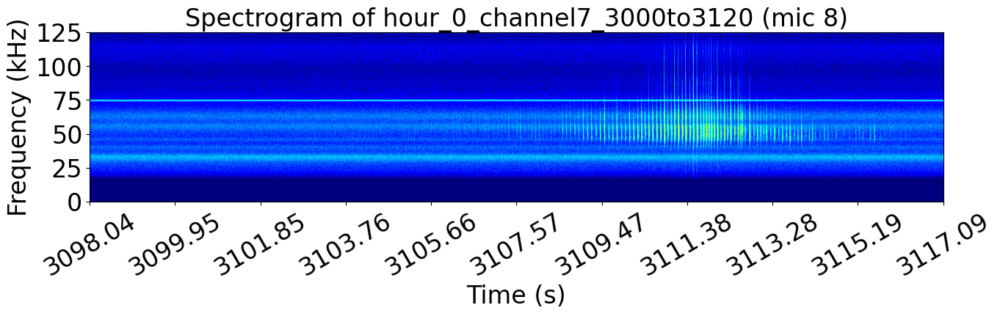

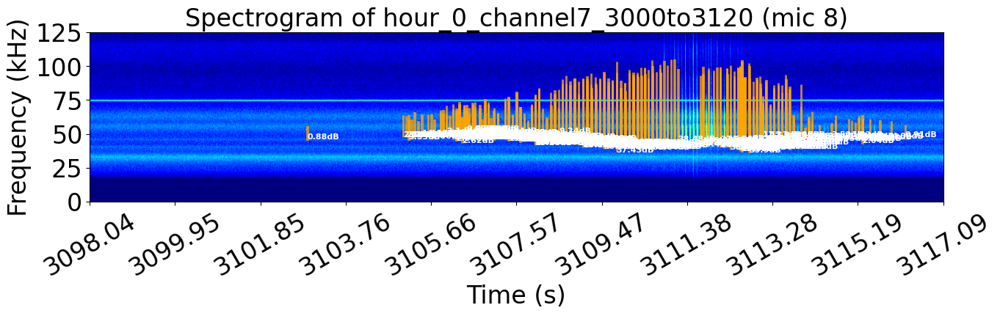

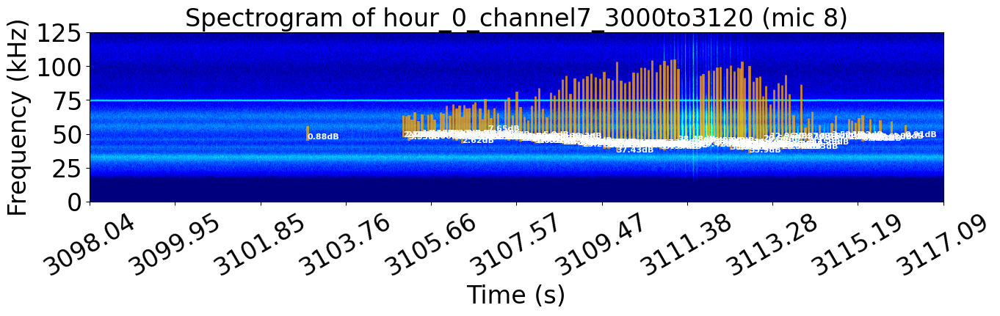

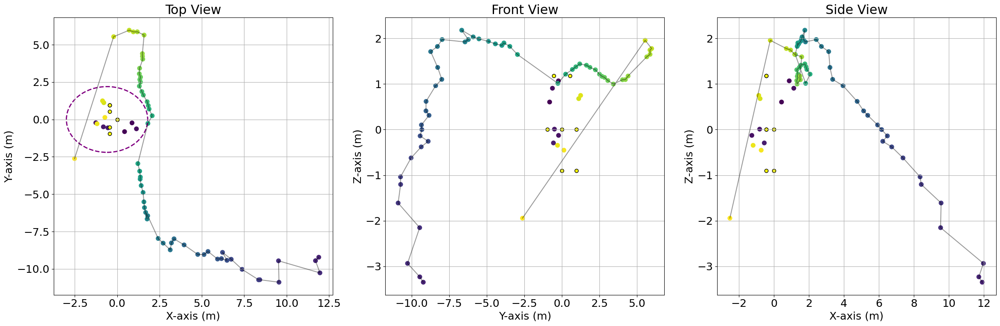

In [7]:
%matplotlib inline

for file_offset in np.arange(0, 3600, 120):
    FILE_TIME_TAG = f'{int(file_offset)}to{int(file_offset+FILE_DURATION)}'
    dir_name = f'{HOUR_TAG}_{FILE_TIME_TAG}'
    write_dir = file_dir / dir_name

    channel_dets = localize.get_dets_observed_from_all_channels(microphones_used, file_dir, file_offset)

    channel_dets.sort_values(by='start_time', inplace=True)
    channel_dets.reset_index(drop=True, inplace=True)
    removed_overlaps = localize.remove_overlapping_events(channel_dets, time_threshold=0.01)
    snr_thresh_dets = removed_overlaps[removed_overlaps['SNR']>=15].copy()
    if len(snr_thresh_dets)>0:
        tagged_dets = clstr.classify_bouts_in_detector_preds_for_freqgroups(snr_thresh_dets, bout_params)
        bout_metrics = clstr.construct_bout_metrics_from_location_df_for_freqgroups(tagged_dets)
        write_file = write_dir / f'{HOUR_TAG}_channel{SELECTED_CHANNEL_FOR_REF}_{FILE_TIME_TAG}.WAV'

        for boutnum, bout in bout_metrics.iterrows():
            start = max(0, bout['start_time'] - file_offset - 1.5*bout['bout_duration_in_secs'])
            length = min(bout['bout_duration_in_secs']*3, (FILE_DURATION) - start)
            plot_channel_dets = channel_dets.loc[(channel_dets['start_time']>=(file_offset+start))&(channel_dets['end_time']<=(file_offset+start+length))]
            plot_dets = removed_overlaps.loc[(removed_overlaps['start_time']>=(file_offset+start))&(removed_overlaps['end_time']<=(file_offset+start+length))]

            if len(plot_dets[plot_dets['SNR']>=15])>=0:
                set_for_tdoa = plot_dets[plot_dets['SNR']>=0].reset_index(drop=True).copy()
                localize.plot_audio_bout(write_file, SELECTED_CHANNEL_FOR_REF, start, length, file_offset, plot_channel_dets, set_for_tdoa)

                calls_for_tdoa, call_voltage_rms, snr_facs_for_tdoa, det_durs_for_tdoa = localize.find_relevant_tdoa_arrays(set_for_tdoa, microphones_used, file_offset, write_dir)
                t_delay_wrt_selected_channel = localize.find_d_mics_to_ref_using_GCC(set_for_tdoa, microphones_used, calls_for_tdoa, snr_facs_for_tdoa, det_durs_for_tdoa)
                d_mics_to_ref_meters, A_locs_mat_tdoa_inches = localize.get_d_mics_with_mic_locs(microphones_used, t_delay_wrt_selected_channel, SELECTED_CHANNEL_FOR_REF)
                A_locs_mat_tdoa_meters = A_locs_mat_tdoa_inches * (254/10000)

                source_points = localize.assemble_source_points_in_meters(d_mics_to_ref_meters, microphones_used, A_locs_mat_tdoa_meters)
                dist_travel_per_point = ((source_points[:,1:] - source_points[:,:-1])**2)[:3,:].sum(axis=0)
                time_between_points = (set_for_tdoa['end_time'][1:].values - set_for_tdoa['start_time'][:-1].values)
                speed_between_points = dist_travel_per_point / time_between_points

                e1 = -0.6
                e2 = 0
                a = 2.4
                b = 2.2

                speed_threshold = 12
                dets_with_valid_speeds = set_for_tdoa[np.concatenate([[speed_threshold], speed_between_points])<speed_threshold]
                src_points_with_valid_speeds = source_points[:,np.concatenate([[speed_threshold], speed_between_points])<speed_threshold]
                source_x_coords = src_points_with_valid_speeds[0,:]
                source_y_coords = src_points_with_valid_speeds[1,:]
                distance_of_points_from_ellipse = (((source_x_coords - e1) / a)**2) + (((source_y_coords - e2) / b)**2)

                valid_dets_outside_unit_circle = dets_with_valid_speeds[distance_of_points_from_ellipse>1]
                valid_speed_src_points_outside_unit_circle = src_points_with_valid_speeds[:,distance_of_points_from_ellipse>1]

                plt.figure(figsize=(24, 8))
                plt.rcParams.update({'font.size':18})
                localize.plot_three_plane_trajectories(valid_dets_outside_unit_circle, valid_speed_src_points_outside_unit_circle, 
                                                    src_points_with_valid_speeds, A_locs_mat_tdoa_meters, start, length)
                plt.subplot(131)
                plt.title('Top View')
                plt.grid(which='both')
                plt.xlabel('X-axis (m)')
                plt.ylabel('Y-axis (m)')
                ellipse = patches.Ellipse((e1, e2), width=2*a, height=2*b, edgecolor="purple", facecolor="none", linestyle="--", linewidth=2)
                plt.gca().add_patch(ellipse)

                plt.subplot(132)
                plt.title('Front View')
                plt.grid(which='both')
                plt.xlabel('Y-axis (m)')
                plt.ylabel('Z-axis (m)')

                plt.subplot(133)
                plt.title('Side View')
                plt.grid(which='both')
                plt.xlabel('X-axis (m)')
                plt.ylabel('Z-axis (m)')

                plt.tight_layout()
                plt.show()